Alumna: Maria Alejandra Del Porto

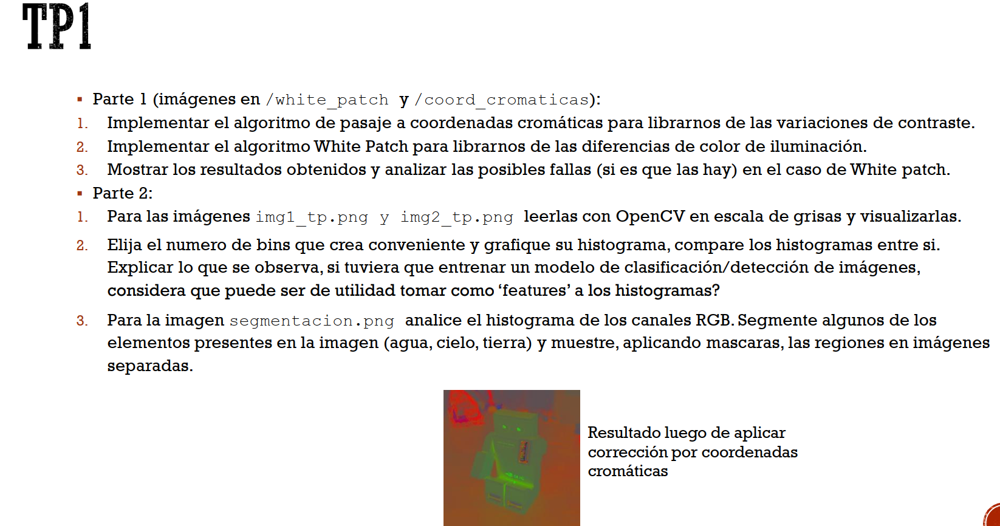

### Importaciones

In [5]:
#Si queremos que las imágenes sean mostradas en una ventana emergente quitar el inline
#%matplotlib inline  
#%matplotlib qt
# OpenCV-Python utiliza NumPy para el manejo de imágenes
import numpy as np
# cv2 es el módulo python para acceder a OpenCV 
import cv2 as cv
# Usamos las poderosas herramientas de graficación de matplotlib para mostrar imágenes, perfiles, histogramas, etc
import matplotlib.pyplot as plt

## ---------------------------------- PARTE 1 ----------------------------------

### 1. Implementar el algoritmo de pasaje a coordenadas cromáticas para librarnos de las variaciones de contraste.


In [6]:
# Carga de imágenes
imgCC1 = cv.imread('.\coord_cromaticas\CoordCrom_1.png')
imgCC2 = cv.imread('.\coord_cromaticas\CoordCrom_2.png')
imgCC3 = cv.imread('.\coord_cromaticas\CoordCrom_3.png')

# Dimensión de la imagen
print(f'Tamaño imagen: {imgCC1.shape} pix')
print(imgCC1)

Tamaño imagen: (996, 908, 3) pix
[[[217 210 215]
  [216 210 215]
  [217 210 216]
  ...
  [180 189 209]
  [177 186 206]
  [176 184 207]]

 [[216 209 216]
  [216 209 216]
  [216 209 216]
  ...
  [175 184 204]
  [178 187 207]
  [176 185 205]]

 [[216 210 216]
  [217 211 216]
  [217 211 216]
  ...
  [176 186 205]
  [176 186 206]
  [173 185 204]]

 ...

 [[103 131 176]
  [104 133 177]
  [107 136 180]
  ...
  [ 76 105 149]
  [ 79 108 152]
  [ 78 107 151]]

 [[104 133 178]
  [102 131 176]
  [103 131 177]
  ...
  [ 79 108 152]
  [ 82 111 155]
  [ 79 108 152]]

 [[102 133 177]
  [101 132 175]
  [102 133 174]
  ...
  [ 82 111 156]
  [ 78 107 152]
  [ 76 104 151]]]


In [7]:
# Concateno las imágenes horizontalmente
concatenated_img = np.hstack((imgCC1, imgCC2, imgCC3))

# tamaño de la pantalla
screen_width, screen_height = 1280, 500

# Si la imagen es más grande que la pantalla, la redimensionamos
if concatenated_img.shape[1] > screen_width or concatenated_img.shape[0] > screen_height:
    concatenated_img = cv.resize(concatenated_img, (screen_width, screen_height))

# Visualizamos la imagen concatenada
cv.imshow('Concatenated Image', concatenated_img)

# cerrar la ventana al presionar cualquier tecla
cv.waitKey(0) 
cv.destroyAllWindows()


Canal rojo


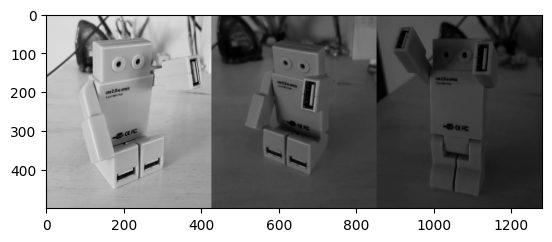

Canal verde


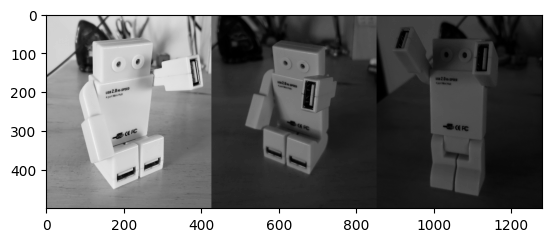

Canal azul


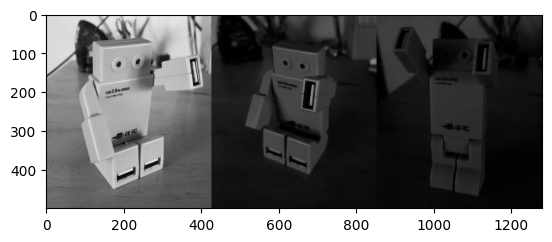

In [5]:
# conversion a espacio de color RGB, en lugar de BGR
concatenated_img = cv.cvtColor(concatenated_img, cv.COLOR_BGR2RGB)

# Probando obetener cada canal rgb para cada imagen
im_r, im_g, im_b = cv.split(concatenated_img)

print('Canal rojo')
plt.imshow(im_r, cmap='gray')
plt.show()
print('Canal verde')
plt.imshow(im_g, cmap='gray')
plt.show()
print('Canal azul')
plt.imshow(im_b, cmap='gray')
plt.show()


In [6]:
# funcion para pasar una imagen a espacio de coordenadas cromáticas

def rgb2XYZ(imagen):

    #imagen = cv.cvtColor(imagen, cv.COLOR_BGR2RGB)

    im_r, im_g, im_b = cv.split(imagen)

    im_r = im_r.astype("float64")
    im_g = im_g.astype("float64")
    im_b = im_b.astype("float64")

    sum_RGB = im_r + im_g + im_b
    sum_RGB=np.where(sum_RGB==0, 1, sum_RGB)# Evitar división por cero
    X = im_r / sum_RGB
    Y = im_g / sum_RGB
    Z = im_b / sum_RGB
   
    XYZ_image = cv.merge([X, Y, Z])
    new_image = cv.normalize(XYZ_image, None, 0, 255, cv.NORM_MINMAX).astype("uint8")

    return new_image

XYZ_image


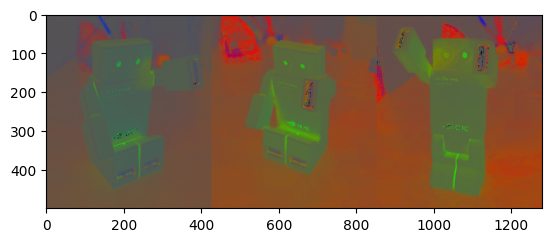

In [7]:
XYZ_image = rgb2XYZ(concatenated_img)

print('XYZ_image')
plt.imshow(XYZ_image)

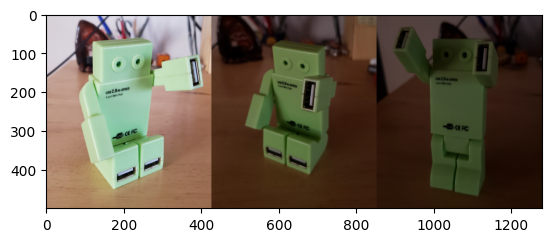

In [8]:
# probando realizar cambios de contraste
concatenated_img_MasContraste=concatenated_img
plt.imshow(concatenated_img_MasContraste)
plt.show()

In [9]:
def change_contrast(input_image:np.ndarray, contrast:int) -> np.ndarray: 
    '''
    Argumentos
    img: Imagen de entrada
    contrast: Valor porcentual de contraste
    ---------------------------------------
    Retorno
    Imagen: (numpy.ndarray) con el nuevo contraste
    '''
    img_new = (1 + contrast / 100) * input_image
    # Clip trunca a lo que se le diga (0 a 255)
    np.clip(img_new, 0, 255, out = img_new)
    # Hay que castear a 8 bits   
    img_new = img_new.astype('uint8')         

    return img_new

Text(0.5, 1.0, 'Contraste +50%, CoordCrom')

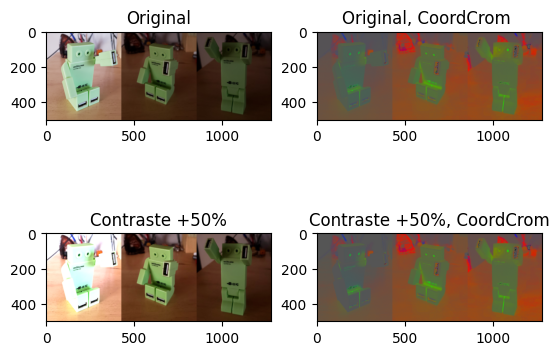

In [10]:
# Imagen original
ax1=plt.subplot(221)
ax1.imshow(concatenated_img, cmap='gray', vmin=0, vmax=255)
ax1.set_title('Original')

ax1=plt.subplot(222)
ax1.imshow(XYZ_image)
ax1.set_title('Original, CoordCrom ')

# Modificación del contraste 50% y cambio a coord cromáticas
new_contrast = 50
img_mod = change_contrast(input_image=concatenated_img, contrast=new_contrast)

ax2=plt.subplot(223)
ax2.imshow(img_mod, cmap='gray', vmin=0, vmax=255)
ax2.set_title('Contraste +50%')

XYZ_image_new_contrast= rgb2XYZ(img_mod)
ax1=plt.subplot(224)
ax1.imshow(XYZ_image_new_contrast)
ax1.set_title('Contraste +50%, CoordCrom')

### 2y3. Implementar el algoritmo With Patch para librarnos de las diferencias de color de iluminación. Mostrar resultados.

In [3]:
# Carga de imágenes
imgWP_Blue1= cv.imread('.\white_patch\wp_blue.jpg')
imgWP_Green1 = cv.imread('.\white_patch\wp_green.png')
imgWP_Green2 = cv.imread('.\white_patch\wp_green2.jpg')
imgWP_Red1 = cv.imread('.\white_patch\wp_red.png')
imgWP_Red2 = cv.imread('.\white_patch\wp_red2.jpg')
imgWP_TestRed = cv.imread('./white_patch/test_red.png')
imgWP_TestGreen= cv.imread('./white_patch/test_green.png')
imgWP_TestBlue = cv.imread('./white_patch/test_blue.png')

#cambio de espacio de color
imgWP_Blue1= cv.cvtColor(imgWP_Blue1, cv.COLOR_BGR2RGB)
imgWP_Green1 = cv.cvtColor(imgWP_Green1, cv.COLOR_BGR2RGB)
imgWP_Green2 = cv.cvtColor(imgWP_Green2, cv.COLOR_BGR2RGB)
imgWP_Red1 = cv.cvtColor(imgWP_Red1, cv.COLOR_BGR2RGB)
imgWP_Red2 = cv.cvtColor(imgWP_Red2, cv.COLOR_BGR2RGB)
imgWP_TestRed = cv.cvtColor(imgWP_TestRed, cv.COLOR_BGR2RGB)
imgWP_TestGreen = cv.cvtColor(imgWP_TestGreen, cv.COLOR_BGR2RGB)
imgWP_TestBlue = cv.cvtColor(imgWP_TestBlue, cv.COLOR_BGR2RGB)

In [8]:
# Lista de imágenes
imagenes = [
    imgWP_Blue1,
    imgWP_Green1,
    imgWP_Green2,
    imgWP_Red1,
    imgWP_Red2,
    imgWP_TestRed,
    imgWP_TestGreen,
    imgWP_TestBlue
]

# Lista de nombres de imágenes
nombres = [
    "imgWP_Blue1",
    "imgWP_Green1",
    "imgWP_Green2",
    "imgWP_Red1",
    "imgWP_Red2",
    "imgWP_TestRed",
    "imgWP_TestGreen",
    "imgWP_TestBlue"
]


In [9]:
imagenes_modificadas = []


for i, img in enumerate(imagenes):
        
    # Separación de cada canal rgb
    im_r, im_g, im_b = cv.split(img)

   # Obtención del valor máximo de cada canal rgb para cada imagen
    max_valor_R = np.max(im_r)  # Canal Rojo
    max_valor_G = np.max(im_g)  # Canal Verde
    max_valor_B = np.max(im_b)  # Canal Azul

    print(f'Imagen {nombres[i]}:')
    print(f'Valor máximo en canal Rojo: {max_valor_R}')
    print(f'Valor máximo en canal Verde: {max_valor_G}')
    print(f'Valor máximo en canal Azul: {max_valor_B}')
    print('-' * 30)
    
    im_r = im_r.astype("float64")
    im_g = im_g.astype("float64")
    im_b = im_b.astype("float64")

    # modificación de cada canal según algoritmo de white-patch
    im_r_mod = (255/max_valor_R)*im_r
    im_g_mod = (255/max_valor_G)*im_g
    im_b_mod = (255/max_valor_B)*im_b

    # Comprobar y ajustar los valores para que estén en el rango [0, 255]
    im_r_mod = np.clip(im_r_mod, 0, 255).astype("uint8")
    im_g_mod = np.clip(im_g_mod, 0, 255).astype("uint8")
    im_b_mod = np.clip(im_b_mod, 0, 255).astype("uint8")

    max_valor_R_mod = np.max(im_r_mod)  # Canal Rojo
    max_valor_G_mod  = np.max(im_g_mod)  # Canal Verde
    max_valor_B_mod  = np.max(im_b_mod)  # Canal Azul
    print(f'Imagen {nombres[i]} modificada:')
    print(f'Valor máximo en canal Rojo: {max_valor_R_mod}')
    print(f'Valor máximo en canal Verde: {max_valor_G_mod}')
    print(f'Valor máximo en canal Azul: {max_valor_B_mod}')
    print('-' * 30)
    
    # Composición de la imagen modificada a partir de cada uno de los canales
    img_mod = cv.merge((im_r_mod, im_g_mod, im_b_mod))
    #img_mod = cv.normalize(img_mod, None, 0, 255, cv.NORM_MINMAX).astype("uint8")
    imagenes_modificadas.append(img_mod)



Imagen imgWP_Blue1:
Valor máximo en canal Rojo: 255
Valor máximo en canal Verde: 255
Valor máximo en canal Azul: 255
------------------------------
Imagen imgWP_Blue1 modificada:
Valor máximo en canal Rojo: 255
Valor máximo en canal Verde: 255
Valor máximo en canal Azul: 255
------------------------------
Imagen imgWP_Green1:
Valor máximo en canal Rojo: 126
Valor máximo en canal Verde: 252
Valor máximo en canal Azul: 155
------------------------------
Imagen imgWP_Green1 modificada:
Valor máximo en canal Rojo: 255
Valor máximo en canal Verde: 255
Valor máximo en canal Azul: 255
------------------------------
Imagen imgWP_Green2:
Valor máximo en canal Rojo: 170
Valor máximo en canal Verde: 255
Valor máximo en canal Azul: 172
------------------------------
Imagen imgWP_Green2 modificada:
Valor máximo en canal Rojo: 255
Valor máximo en canal Verde: 255
Valor máximo en canal Azul: 255
------------------------------
Imagen imgWP_Red1:
Valor máximo en canal Rojo: 255
Valor máximo en canal Ve

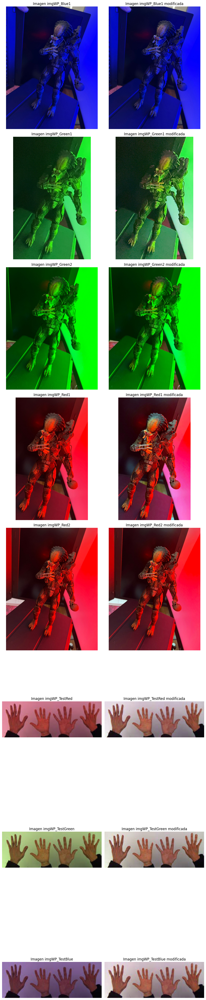

In [10]:
# Graficación de las imagenes originales y las modificadas
# Configurar el diseño de la figura
num_filas = 8
num_columnas = 2

# Crear la figura
fig, axs = plt.subplots(num_filas, num_columnas, figsize=(10, 50))

# Graficar imágenes originales en la columna 1 y las imágenes modificadas en la columna 2
for i, (img_orig, img_mod, ax) in enumerate(zip(imagenes, imagenes_modificadas, axs)):

    ax[0].imshow(img_orig)
    ax[0].axis('off')
    ax[0].set_title(f'Imagen {nombres[i]}')
    
    ax[1].imshow(img_mod)
    ax[1].axis('off')
    ax[1].set_title(f'Imagen {nombres[i]} modificada')

# Ajustar la disposición
plt.tight_layout()

# Mostrar la figura
plt.show()


### 3. Interpretación de los resultados obtenidos al implementar white-patch.

Al analizar las imágenes donde el resultado del algoritmo no es notorio (imágenes: "imgWP_Blue1","imgWP_Green2" y "imgWP_Red2" ) los valores máximos de cada canal ya son altos. Entonces al aplicar el algoritmo donde los coeficientes, que multiplican para modificar el canal, son: 255/ValorMaximoDelCanal terminan siendo cercanos a 1. Es decir, que casi no hay diferencia entre el estado inicial y final del canal. 


## ---------------------------------- PARTE 2 ----------------------------------

### 1. Para las imágenes img1_tp.png y img2_tp.png leerlas con OpenCV en escala de grisas y visualizarlas.


In [19]:
# carga de imágenes
img1_tp = cv.imread('.\img1_tp.png', cv.IMREAD_GRAYSCALE)
img2_tp = cv.imread('.\img2_tp.png', cv.IMREAD_GRAYSCALE)

# mostrar imágenes
# Visualizamos la imagen concatenada
cv.imshow('img1_tp', img1_tp)
cv.imshow('img2_tp', img2_tp)
# cerrar la ventana al presionar cualquier tecla
cv.waitKey(0) 
cv.destroyAllWindows()

### 2. Elija el numero de bins que crea conveniente y grafique su histograma, compare los histogramas entre si. Explicar lo que se observa, si tuviera que entrenar un modelo de clasificación/detección de imágenes, considera que puede ser de utilidad tomar como ‘features’ a los histogramas?


Text(0.5, 1.0, 'img2_tp Histograma Original')

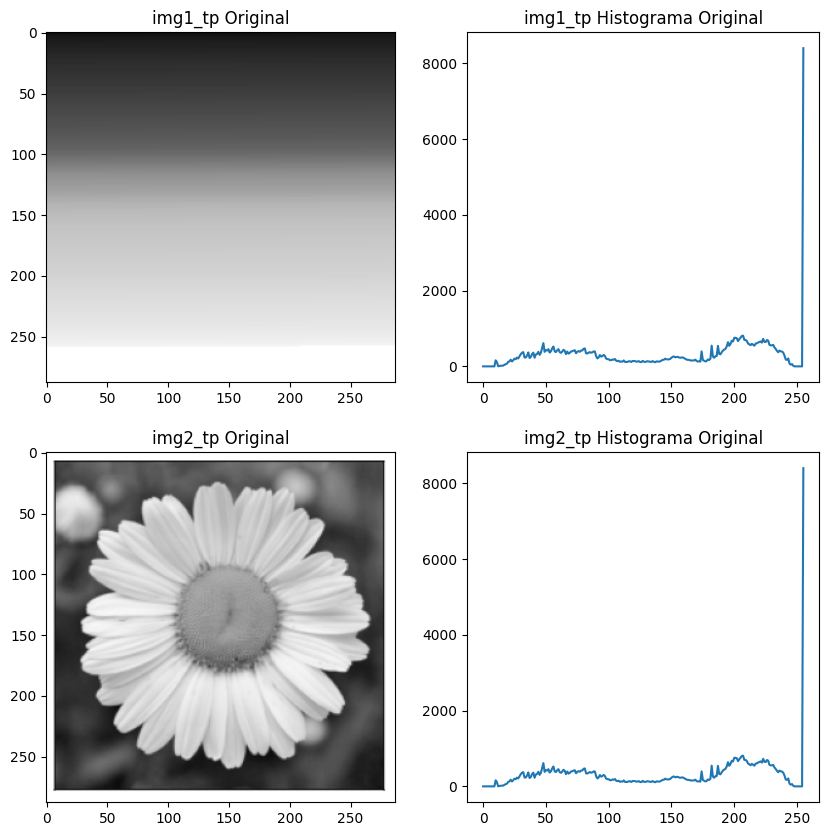

In [26]:
# Nueva figura
#fig = plt.figure()

# Configurar el diseño de la figura
num_filas = 2
num_columnas = 2

# Crear la figura
fig, axs = plt.subplots(num_filas, num_columnas, figsize=(10, 10))

# Número de bins
bins = 256

# Imagen img1_tp original
ax1=plt.subplot(221)
ax1.imshow(img1_tp, cmap='gray', vmin=0, vmax=255)
ax1.set_title('img1_tp Original')

hist1,bins1 = np.histogram(img1_tp.ravel(),bins,[0,256])
ax3=plt.subplot(222)
ax3.plot(hist1)
ax3.set_title('img1_tp Histograma Original')

# Imagen img2_tp original
ax1=plt.subplot(223)
ax1.imshow(img2_tp, cmap='gray', vmin=0, vmax=255)
ax1.set_title('img2_tp Original')

hist2,bins2 = np.histogram(img2_tp.ravel(),bins,[0,256])
ax3=plt.subplot(224)
ax3.plot(hist2)
ax3.set_title('img2_tp Histograma Original')


Al comparar los dos histogramas se observa que ambas imágenes poseen la misma distribución de intensidades. Por lo cual no es significativo utilizar los histograma como features para entrenar modelos para los propósitos indicados.

### 3. Para la imagen segmentacion.png analice el histograma de los canales RGB. Segmente algunos de los elementos presentes en la imagen (agua, cielo, tierra) y muestre, aplicando mascaras, las regiones en imágenes separadas.

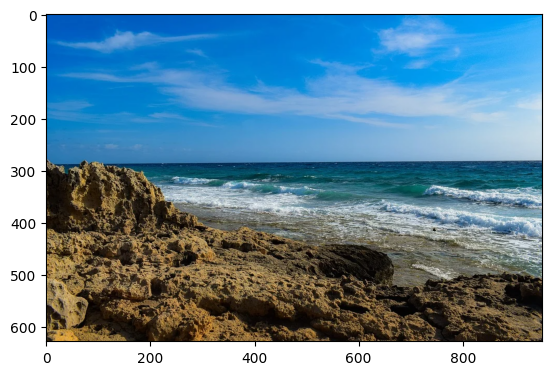

In [18]:
# carga de la imagen
segmentacion_im=cv.imread('segmentacion.png')
# conversion a espacio de color RGB, en lugar de BGR
segmentacion_im = cv.cvtColor(segmentacion_im, cv.COLOR_BGR2RGB)    

# Visualizamos la imagen 
plt.imshow(segmentacion_im)
plt.axis('on')  # Mostrar ejes
plt.show()




Text(0.5, 1.0, 'im_b Histograma')

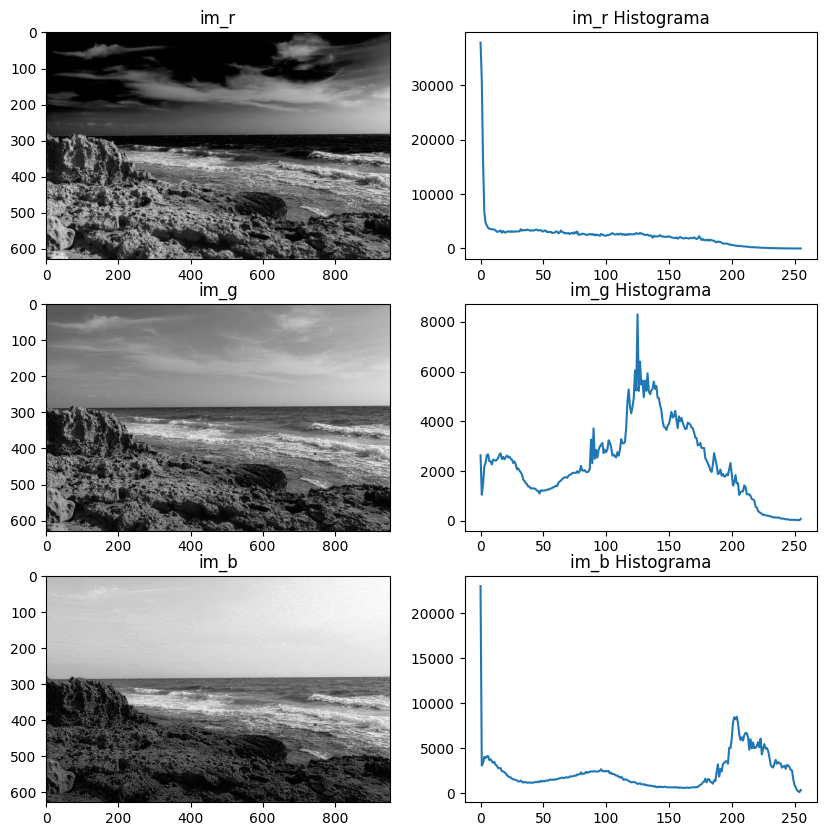

In [3]:

# Separación de cada canal rgb
im_r, im_g, im_b = cv.split(segmentacion_im)

# Configurar el diseño de la figura
num_filas = 3
num_columnas = 2

# Crear la figura
fig, axs = plt.subplots(num_filas, num_columnas, figsize=(10, 10))

# Número de bins
bins = 256

# im_r
ax1=plt.subplot(321)
ax1.imshow(im_r, cmap='gray', vmin=0, vmax=255)
ax1.set_title('im_r')

hist1,bins1 = np.histogram(im_r.ravel(),bins,[0,256])
ax3=plt.subplot(322)
ax3.plot(hist1)
ax3.set_title('im_r Histograma')

# im_g
ax1=plt.subplot(323)
ax1.imshow(im_g, cmap='gray', vmin=0, vmax=255)
ax1.set_title('im_g')

hist2,bins2 = np.histogram(im_g.ravel(),bins,[0,256])
ax3=plt.subplot(324)
ax3.plot(hist2)
ax3.set_title('im_g Histograma')

# im_b
ax1=plt.subplot(325)
ax1.imshow(im_b, cmap='gray', vmin=0, vmax=255)
ax1.set_title('im_b')

hist3,bins3 = np.histogram(im_b.ravel(),bins,[0,256])
ax3=plt.subplot(326)
ax3.plot(hist3)
ax3.set_title('im_b Histograma')

Al observar los histogramas se puede decir que el canal rojo se caracteriza por bajas intensidades, el verde de intensidades intermedias y el azul de intensidades altas. Se podría segmentar considerando eso.

In [12]:
# Segmentar los canales por intervalos de intensidad y generar máscaras
lower_red = np.array([0, 0, 0])
upper_red = np.array([80, 255, 255])
red_mask = cv2.inRange(segmentacion_im, lower_red, upper_red)

lower_green = np.array([81, 0, 0])
upper_green = np.array([160, 255, 255])
green_mask = cv2.inRange(segmentacion_im, lower_green, upper_green)

lower_blue = np.array([161, 0, 0])
upper_blue = np.array([255, 255, 255])
blue_mask = cv2.inRange(segmentacion_im, lower_blue, upper_blue)

# Aplicar las máscaras
red_region = cv2.bitwise_and(image, image, mask=red_mask)
green_region = cv2.bitwise_and(image, image, mask=green_mask)
blue_region = cv2.bitwise_and(image, image, mask=blue_mask)

# Imagenes segmentadas regiones segmentadas
cv2.imshow('Región Roja', red_region)
cv2.imshow('Región Verde', green_region)
cv2.imshow('Región Azul', blue_region)

cv2.waitKey(0)
cv2.destroyAllWindows()

In [11]:
# Segmentar los canales por intervalos de intensidad y generar máscaras
lower_red = np.array([0, 0, 0])
upper_red = np.array([80, 255, 255])
red_mask = cv2.inRange(segmentacion_im, lower_red, upper_red)

lower_green = np.array([81, 0, 0])
upper_green = np.array([160, 255, 255])
green_mask = cv2.inRange(segmentacion_im, lower_green, upper_green)

lower_blue = np.array([161, 0, 0])
upper_blue = np.array([255, 255, 255])
blue_mask = cv2.inRange(segmentacion_im, lower_blue, upper_blue)

# Aplicar las máscaras
red_region = cv2.bitwise_and(image, image, mask=red_mask)
green_region = cv2.bitwise_and(image, image, mask=green_mask)
blue_region = cv2.bitwise_and(image, image, mask=blue_mask)

# Imagenes segmentadas regiones segmentadas
cv2.imshow('Región Roja', red_region)
cv2.imshow('Región Verde', green_region)
cv2.imshow('Región Azul', blue_region)

cv2.waitKey(0)
cv2.destroyAllWindows()

El algoritmo de segmentación no es el adecuado, dado que los segmtentos de la imagenes no poseen colores propios que los distingan.

Entonces probaré tomar una muestra de cada segmento.

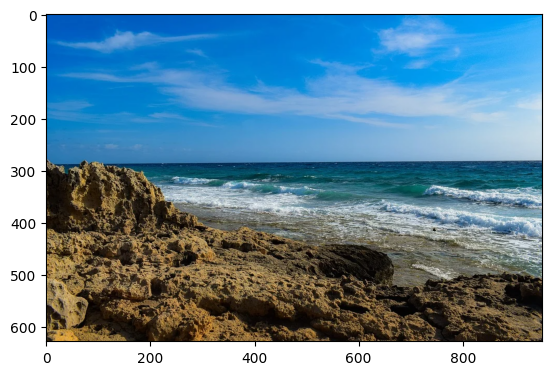

In [19]:
# Visualizamos la imagen 
plt.imshow(segmentacion_im)
plt.axis('on')  # Mostrar ejes
plt.show()


In [82]:
# Muestra de cada segmento
img_muestra_cielo = segmentacion_im[0:250,0:800,:]
img_muestra_agua= segmentacion_im[285:350,500:900,:]
img_muestra_tierra = segmentacion_im[400:600,0:400,:]


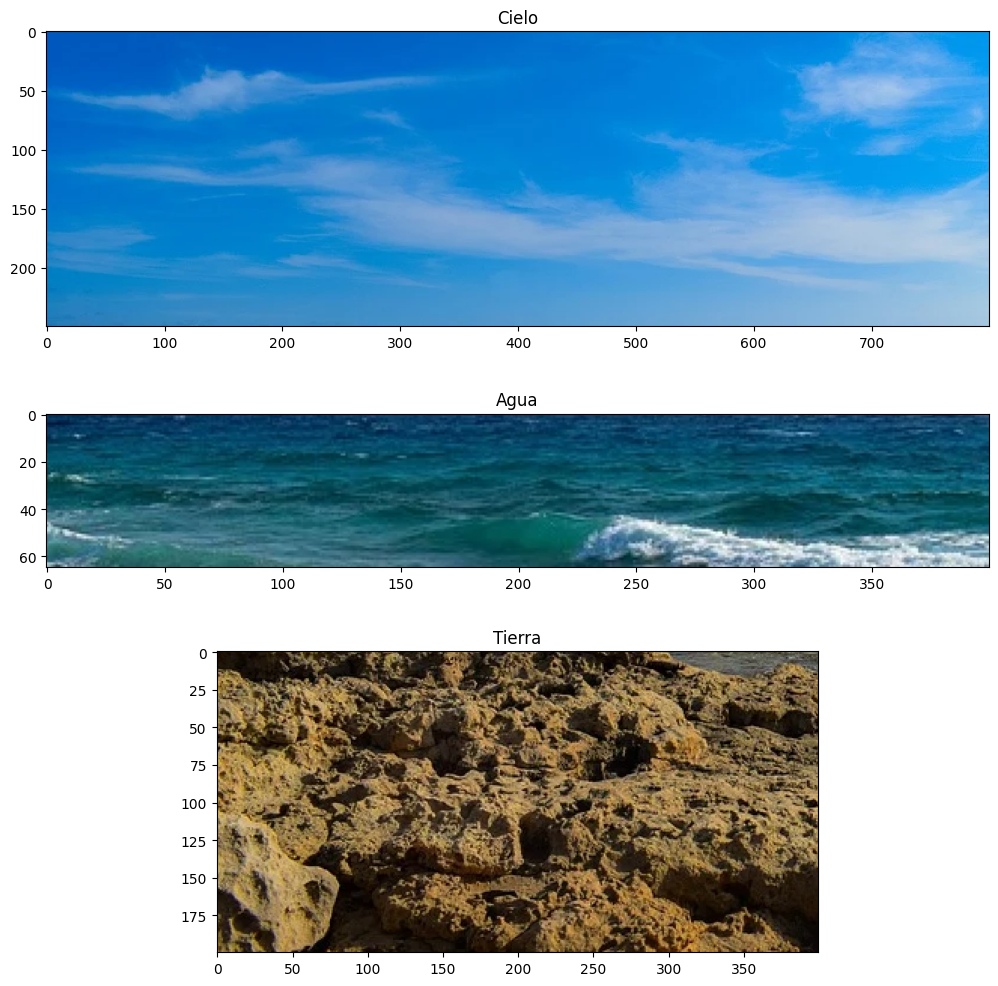

In [34]:
# Visualizacion de las muestras
plt.figure(figsize=(10, 10))

plt.subplot(3, 1, 1)
plt.imshow(img_muestra_cielo)
plt.title('Cielo')

plt.subplot(3, 1, 2)
plt.imshow(img_muestra_agua)
plt.title('Agua')

plt.subplot(3, 1, 3)
plt.imshow(img_muestra_tierra)
plt.title('Tierra')

# Ajustar espaciado entre subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

In [83]:
#Calcular la media y desviación estándar en el espacio RGB para cada muestra
color_mean_cielo, color_std_cielo = cv.meanStdDev(img_muestra_cielo)
color_mean_agua, color_std_agua = cv.meanStdDev(img_muestra_agua)
color_mean_tierra, color_std_tierra = cv.meanStdDev(img_muestra_tierra)

# Imprimir los resultados
print("Muestra Cielo - Media de Color (RGB):", color_mean_cielo.flatten().tolist())
print("Muestra Agua - Media de Color (RGB):", color_mean_agua.flatten().tolist())
print("Muestra Tierra - Media de Color (RGB):", color_mean_tierra.flatten().tolist())
print("Muestra Cielo - Desviación Estándar de Color (RGB):", color_std_cielo.flatten().tolist())
print("Muestra Agua - Desviación Estándar de Color (RGB):", color_std_agua.flatten().tolist())
print("Muestra Tierra - Desviación Estándar de Color (RGB):", color_std_tierra.flatten().tolist())

Muestra Cielo - Media de Color (RGB): [48.541315000000004, 142.97586, 213.016635]
Muestra Agua - Media de Color (RGB): [31.93776923076923, 93.144, 112.52865384615384]
Muestra Tierra - Media de Color (RGB): [100.4831125, 79.4598125, 48.5903]
Muestra Cielo - Desviación Estándar de Color (RGB): [52.06722388480852, 25.65431771184722, 13.24428625018252]
Muestra Agua - Desviación Estándar de Color (RGB): [45.792383188698444, 35.714774395953334, 32.72532696721224]
Muestra Tierra - Desviación Estándar de Color (RGB): [58.02695916392951, 51.619836642175116, 38.28442138664238]


De la estadística se ve que los valores de dispersión son altos y que las medias entre los canales rojo y verde pueden no ser considerablemente diferentes (salvo para el canal azul).

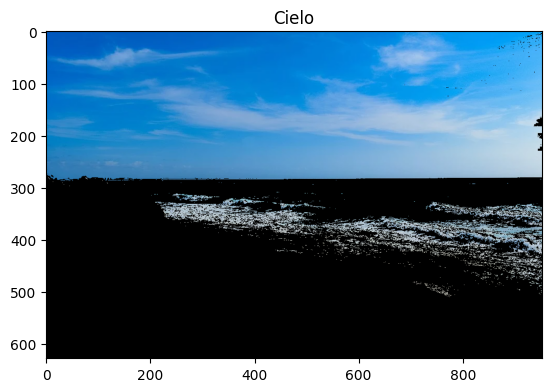

<function matplotlib.pyplot.show(close=None, block=None)>

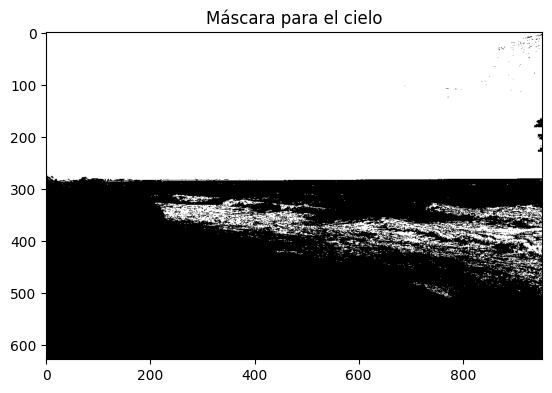

In [84]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 3 sigmas
# para ¨capturar¨ el 99.7 % de pixeles. En este caso se observa parte del oleaje del agua, pero si uso 
#sigmas más bajos se pierde parte del cielo.
n_sigma = 3
mask = cv.inRange(segmentacion_im, color_mean_cielo-color_std_cielo * n_sigma,  color_mean_cielo+color_std_cielo * n_sigma)
img_segmentada = cv.bitwise_and(segmentacion_im, segmentacion_im, mask=mask)

plt.figure(3)
plt.imshow(img_segmentada)
plt.title('Cielo')
plt.show()

plt.figure(4)
plt.imshow(mask,cmap='gray')
plt.title('Máscara para el cielo')
plt.show

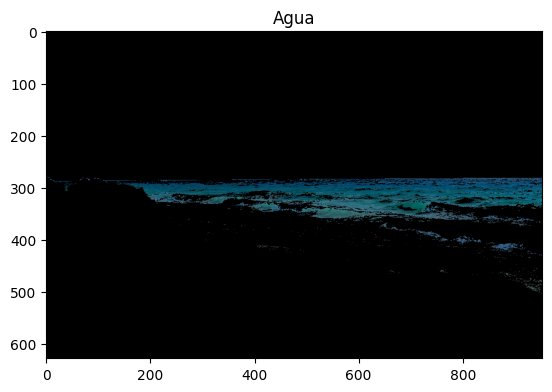

<function matplotlib.pyplot.show(close=None, block=None)>

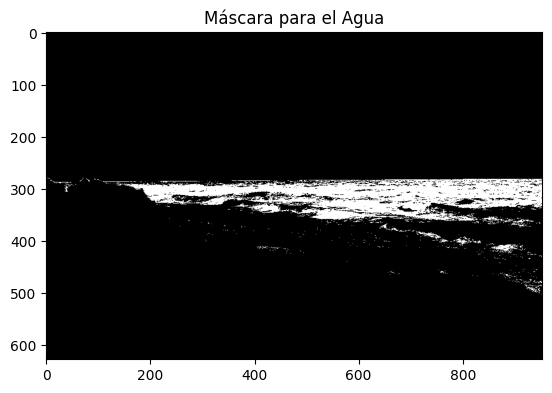

In [85]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 1 sigma, dado que para sigma 2 o 3 la segmentación no es tan buena
# y se ve parte de la tierra. Aunque, para sigma 1 se pierden la región de oleaje.

n_sigma = 1
mask = cv.inRange(segmentacion_im, color_mean_agua-color_std_agua * n_sigma,  color_mean_agua+color_std_agua * n_sigma)
img_segmentada = cv.bitwise_and(segmentacion_im, segmentacion_im, mask=mask)

plt.figure(3)
plt.imshow(img_segmentada)
plt.title('Agua')
plt.show()

plt.figure(4)
plt.imshow(mask,cmap='gray')
plt.title('Máscara para el Agua')
plt.show

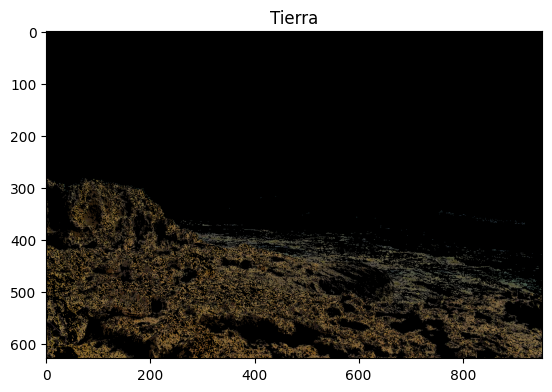

<function matplotlib.pyplot.show(close=None, block=None)>

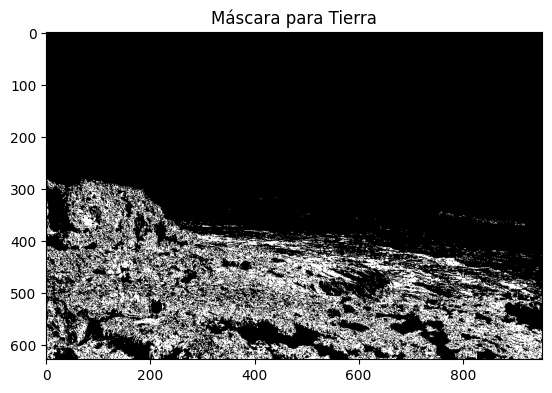

In [55]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 1 sigma, dado que para sigma 2 o 3 la segmentación no es tan buena
# y se ve parte del agua. Aunque, para sigma 1 se pierde detalle de la tierra.

n_sigma = 1
mask = cv.inRange(segmentacion_im, color_mean_tierra-color_std_tierra * n_sigma,  color_mean_tierra+color_std_tierra * n_sigma)
img_segmentada = cv.bitwise_and(segmentacion_im, segmentacion_im, mask=mask)

plt.figure(3)
plt.imshow(img_segmentada)
plt.title('Tierra')
plt.show()

plt.figure(4)
plt.imshow(mask,cmap='gray')
plt.title('Máscara para Tierra')
plt.show

Si bien este algoritmo de segmentación es mejor que el anterior, tiene los problemas comentados al probar distintos valores de sigma. 

Por ello voy a probar segmentar haciendo un cambio de de espacio de color: de RGB a HSV.

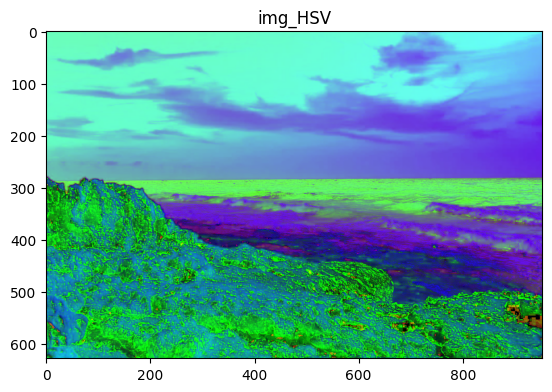

In [87]:
img_HSV = cv.cvtColor(segmentacion_im, cv.COLOR_RGB2HSV)
plt.figure(6)
plt.imshow(img_HSV)
plt.title('img_HSV')
plt.show()

Text(0.5, 1.0, 'c3 Histograma')

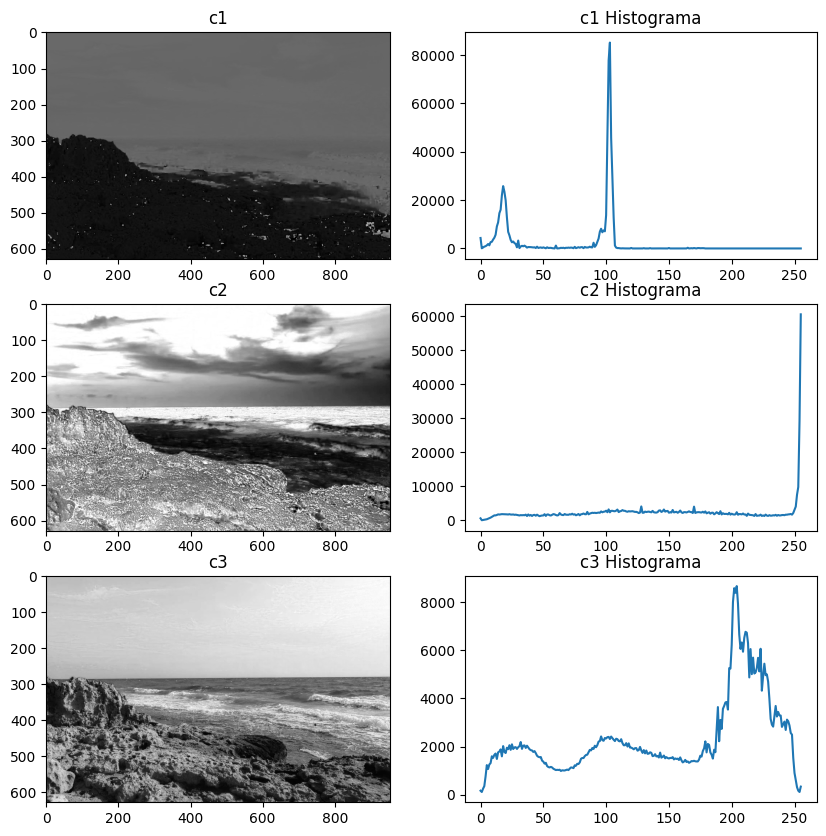

In [88]:
#Separación de cada canal 
c1, c2, c3 = cv.split(img_HSV)

# Configurar el diseño de la figura
num_filas = 3
num_columnas = 2

# Crear la figura
fig, axs = plt.subplots(num_filas, num_columnas, figsize=(10, 10))

# Número de bins
bins = 256

# c1
ax1=plt.subplot(321)
ax1.imshow(c1, cmap='gray', vmin=0, vmax=255)
ax1.set_title('c1')

hist1,bins1 = np.histogram(c1.ravel(),bins,[0,256])
ax3=plt.subplot(322)
ax3.plot(hist1)
ax3.set_title('c1 Histograma')

# c2
ax1=plt.subplot(323)
ax1.imshow(c2, cmap='gray', vmin=0, vmax=255)
ax1.set_title('c2')

hist2,bins2 = np.histogram(c2.ravel(),bins,[0,256])
ax3=plt.subplot(324)
ax3.plot(hist2)
ax3.set_title('c2 Histograma')

# c3
ax1=plt.subplot(325)
ax1.imshow(c3, cmap='gray', vmin=0, vmax=255)
ax1.set_title('c3')

hist3,bins3 = np.histogram(c3.ravel(),bins,[0,256])
ax3=plt.subplot(326)
ax3.plot(hist3)
ax3.set_title('c3 Histograma')

In [89]:
# Muestra de cada segmento
img_muestra_cielo = img_HSV[0:250,0:800,:]
img_muestra_agua= img_HSV[285:350,500:900,:]
img_muestra_tierra = img_HSV[400:600,0:400,:]

#Calcular la media y desviación estándar en el espacio RGB para cada muestra
color_mean_cielo, color_std_cielo = cv.meanStdDev(img_muestra_cielo)
color_mean_agua, color_std_agua = cv.meanStdDev(img_muestra_agua)
color_mean_tierra, color_std_tierra = cv.meanStdDev(img_muestra_tierra)

# Imprimir los resultados
print("Muestra Cielo - Media de Color (HSV):", color_mean_cielo.flatten().tolist())
print("Muestra Agua - Media de Color (HSV):", color_mean_agua.flatten().tolist())
print("Muestra Tierra - Media de Color (HSV):", color_mean_tierra.flatten().tolist())
print("Muestra Cielo - Desviación Estándar de Color (HSV):", color_std_cielo.flatten().tolist())
print("Muestra Agua - Desviación Estándar de Color (HSV):", color_std_agua.flatten().tolist())
print("Muestra Tierra - Desviación Estándar de Color (HSV):", color_std_tierra.flatten().tolist())

Muestra Cielo - Media de Color (HSV): [103.01054, 198.37045500000002, 213.016635]
Muestra Agua - Media de Color (HSV): [97.17565384615385, 197.78703846153846, 112.61592307692308]
Muestra Tierra - Media de Color (HSV): [17.8312375, 150.42643750000002, 100.50143750000001]
Muestra Cielo - Desviación Estándar de Color (HSV): [1.4888179567694777, 59.77977666479672, 13.24428625018252]
Muestra Agua - Desviación Estándar de Color (HSV): [3.635597447910455, 60.42264661785529, 32.695649327045935]
Muestra Tierra - Desviación Estándar de Color (HSV): [11.98221000978508, 54.99041906149277, 58.02006461504151]


Para cielo y agua,la mayor difencia se da para la media del canal V.

Para agua y tierra la mayor diferencia se da para la media del canal H.

Para tierra y cielo las mayores diferencias se da para la media de los canales H y V. 

A tener en cuenta, la dispersión del canal V es considerable para el caso de la tierra aunque a priori no lo suficiente para dificultar la segmentacion entre tierra y cielo.

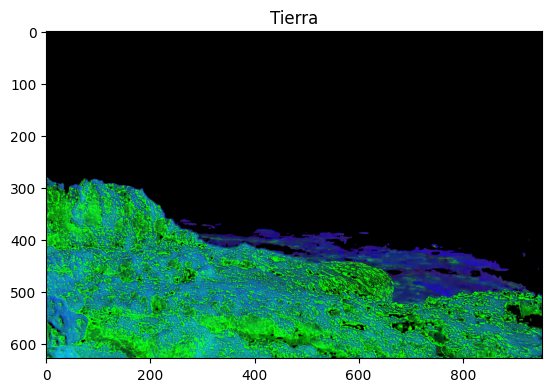

Text(0.5, 1.0, 'Máscara para Tierra')

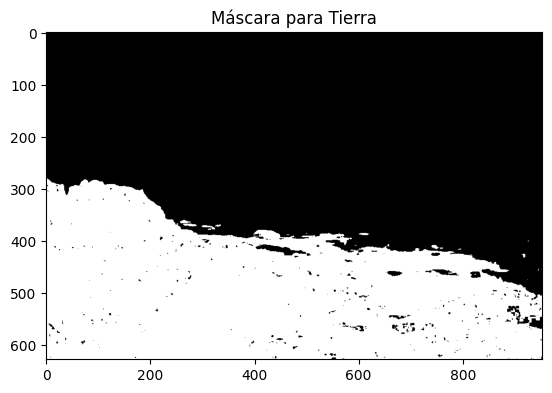

In [94]:
# Pintemos de blanco los puntos que estén cerca de la media en un radio menor que 3 sigma.

n_sigma = 3
mask = cv.inRange(img_HSV, color_mean_tierra-color_std_tierra * n_sigma,  color_mean_tierra+color_std_tierra * n_sigma)
img_segmentada_tierra = cv.bitwise_and(img_HSV, img_HSV, mask=mask)

plt.figure(3)
plt.imshow(img_segmentada_tierra)
plt.title('Tierra')
plt.show()

plt.figure(4)
plt.imshow(mask,cmap='gray')
plt.title('Máscara para Tierra')

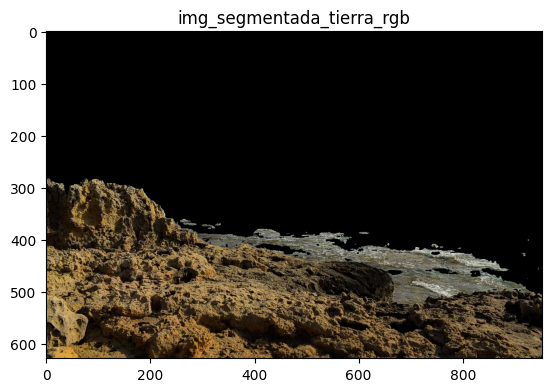

In [95]:
# tierra: de HSV a RGB
img_segmentada_tierra_rgb = cv.cvtColor(img_segmentada_tierra, cv.COLOR_HSV2RGB)
plt.figure(6)
plt.imshow(img_segmentada_tierra_rgb)
plt.title('img_segmentada_tierra_rgb')
plt.show()

Separó notoriamente la tierra del cielo, pero contiene algo de agua.
Pruebo segmentar con un solo canal:

Text(0.5, 1.0, 'Máscara para Tierra')

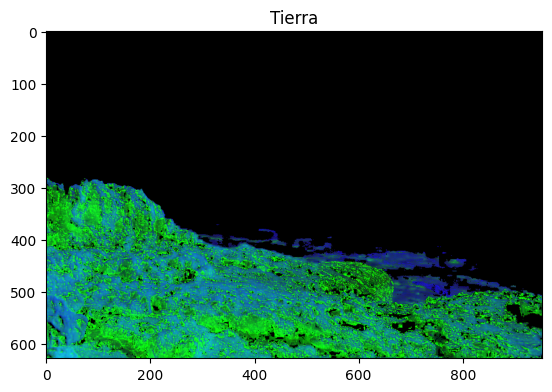

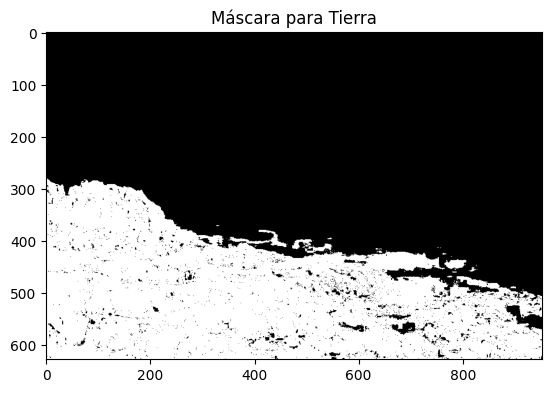

In [111]:
# Calcular la media y desviación estándar en el espacio HSV solo para el canal H
H_mean_tierra, H_std_tierra = cv.meanStdDev(img_muestra_tierra[:,:,0])

# Pintar de blanco los puntos que estén cerca de la media en un radio menor que 3 sigma
n_sigma = 1
mask_H = cv.inRange(img_HSV[:,:,0], int(H_mean_tierra - H_std_tierra * n_sigma), int(H_mean_tierra + H_std_tierra * n_sigma))
img_segmentada_tierra = cv.bitwise_and(img_HSV, img_HSV, mask=mask_H)
plt.figure(3)
plt.imshow(img_segmentada_tierra)
plt.title('Tierra')

plt.figure(4)
plt.imshow(mask_H, cmap='gray')
plt.title('Máscara para Tierra')

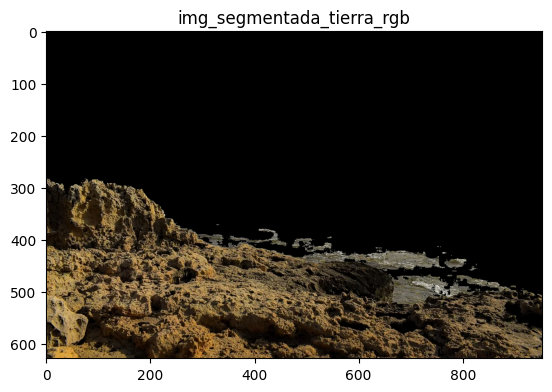

In [112]:
# tierra: de HSV a RGB
img_segmentada_tierra_rgb = cv.cvtColor(img_segmentada_tierra, cv.COLOR_HSV2RGB)
plt.figure(6)
plt.imshow(img_segmentada_tierra_rgb)
plt.title('img_segmentada_tierra_rgb')
plt.show()

La segmentación mejoró pero no considerablemente.

Luego de haber probado distintos algoritmos en búsqueda casi perfecta concluyo que segmentar imagenes donde cada segmento no contiene colores en rangos mutuamente excluyentes en cuanto al matiz, la segmentación exacta se dificulta. De todos modos, es notable la mejora introducida por el uso de muestras.